## Reddit consumer table

1NF - The table doesn't have any columns with multiple values in a single cell. So the table has atomic values in all cells. The table is in 1NF.

2NF - The table has id column as primary key. That satisfies the 2NF.

3NF - The table has upvote_ratio as a column which is dependant on the score column. So the upvote_ratio is been removed from the main table and added in a seperate table and added the id column also in the second table. This will make the table satisfy 3NF. 

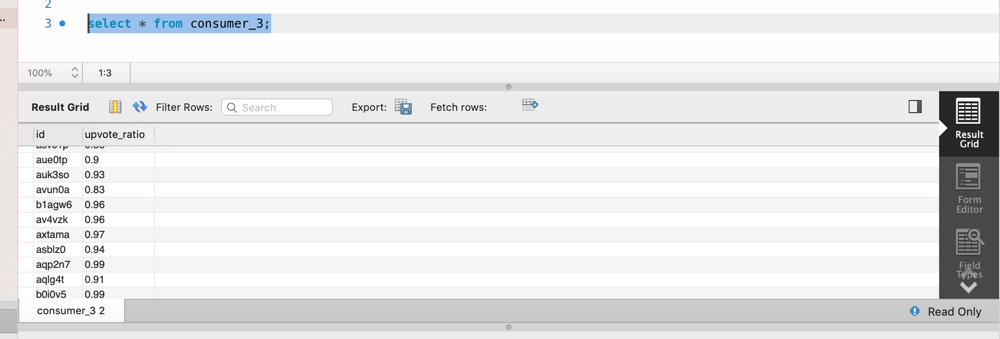

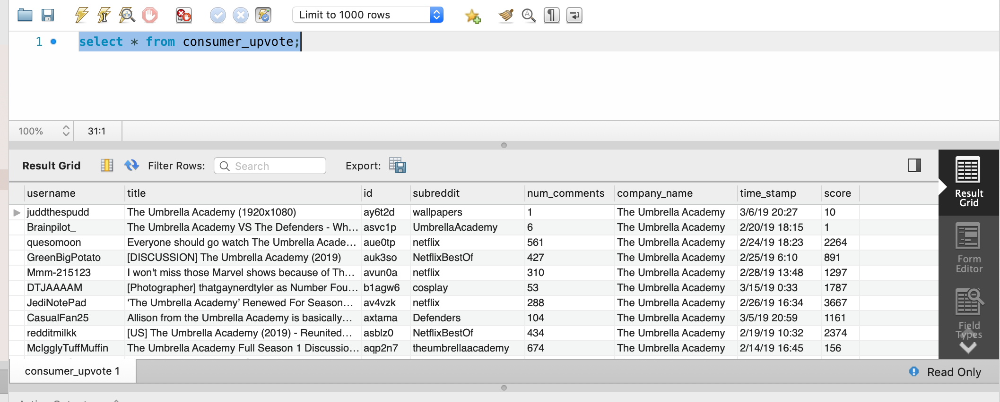

## Stored Procedure:

1. To select the post,tweet id, time stamp of when the user posted and the screen name from the company table based on the input(screen name) got from the users.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `basedon_screenname`(IN screen nvarchar(30))
       BEGIN
       SELECT post,tweet_id,timestamp,screenname from company_3 where screenname = screen;
       END

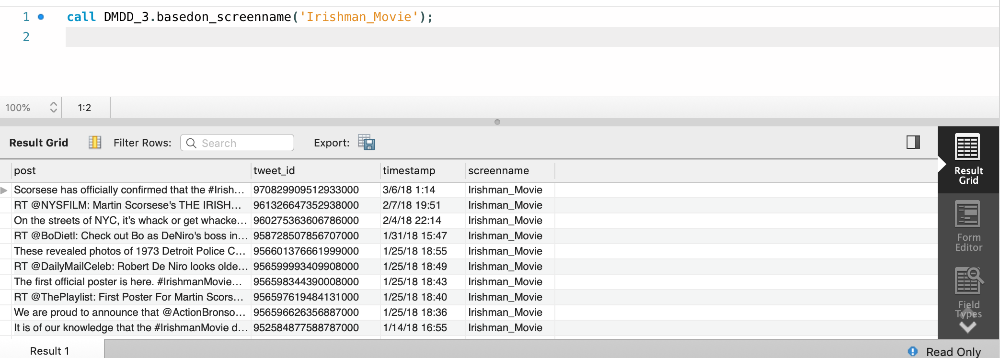

2. To select all the columns from the table consumer.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `select_all_consumers`()
       BEGIN
       select consumer_3.username,consumer_3.title,consumer_3.id,consumer_3.subreddit,consumer_3.num_comments,
       consumer_3.company_name,consumer_3.time_stamp,consumer_3.score,consumer_upvote.upvote_ratio from consumer_3
       INNER JOIN consumer_upvote on consumer_3.id = consumer_3.id;
       END

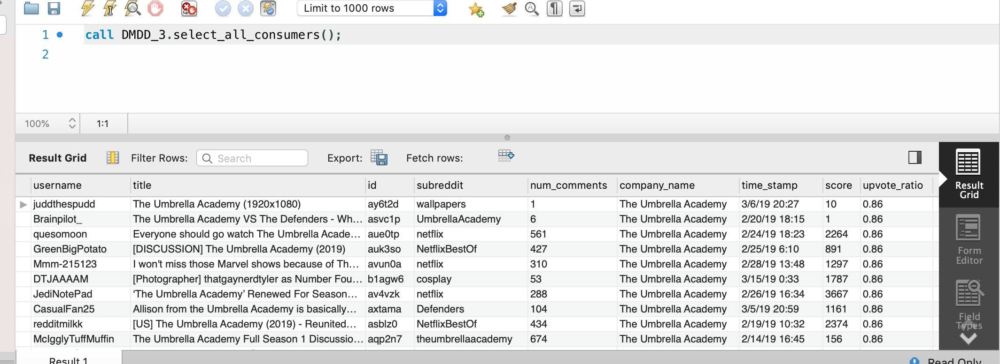

3. To select the username,subreddit and timestamp from the company table by getting the input(company name) from the users.


    CREATE DEFINER=`root`@`localhost` PROCEDURE `select_by_company_name`(IN company_name nvarchar(30))
    BEGIN
    SELECT username,subreddit,time_stamp FROM consumer_3 WHERE company_name = @company_name LIMIT 10;
    END

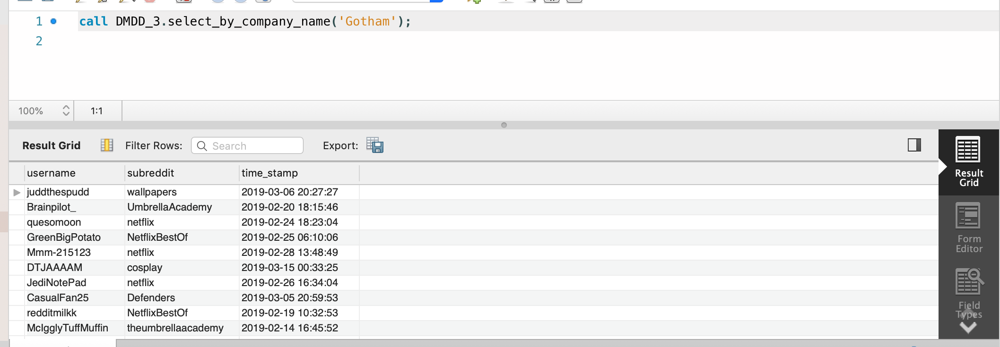

4. To select the username, title and the subreddit from the consumer based on the input(top score) got from the users.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `select_by_top_score`(IN score integer) 
       BEGIN
       SELECT username,title,subreddit from consumer_3 where score >= score LIMIT 5;
       END

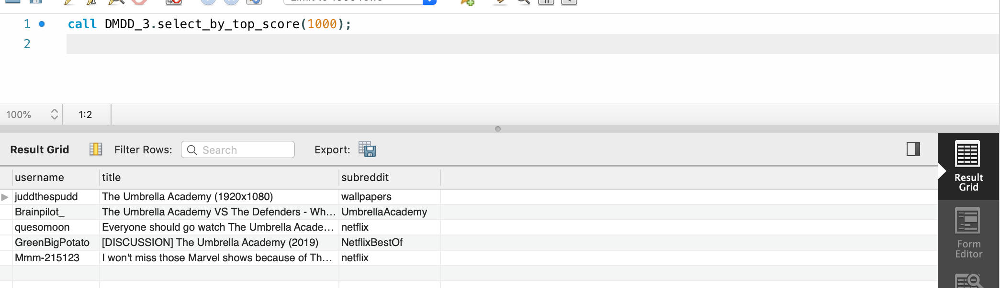

5. To the movie name, its imdb ratings, votes, runtime and genre of the movie from the movies database based on the input(imdb ratings) got from the users.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `select_by_imdb_rating`(IN imdb_ratings float)
       BEGIN
       SELECT movie_names,imdb_ratings,votes,runtime,genre FROM imdb_movies_3 WHERE imdb_ratings = imdb_ratings LIMIT 10;
       END

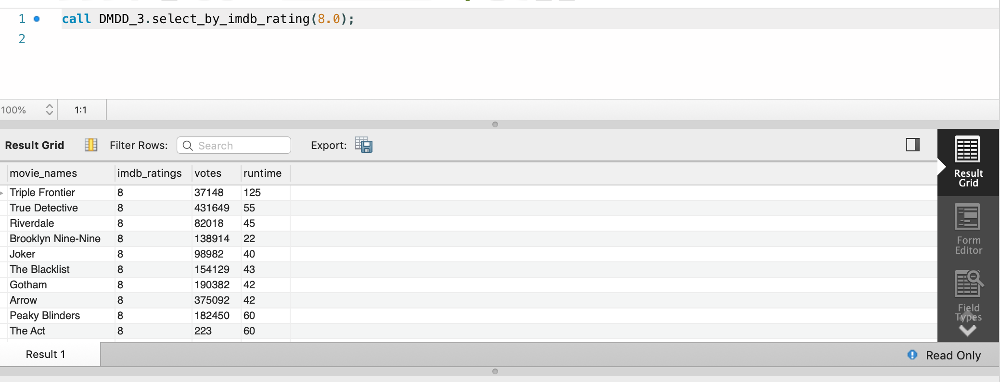

6. To select the movie name, its imdb ratings and the run time of the movie from the movies database based on the input(the year the movie was released) got from the users.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `select_by_imdb_rating`(IN imdb_ratings float)
       BEGIN
       select movie_names,imdb_ratings,votes,runtime from imdb_movies_3 where imdb_ratings = imdb_ratings LIMIT 10;
       END

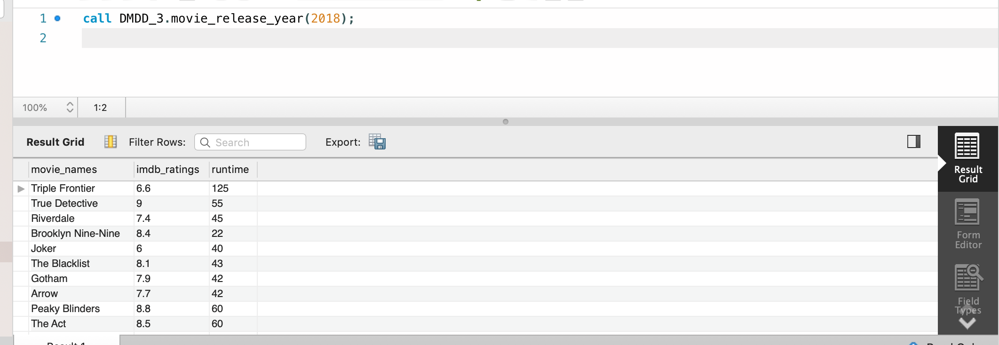

7. To get the count of the posts a particular user has posted from the consumer table based on the input(the username) got from the users.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `number_of_posts`(IN users nvarchar(30))
       BEGIN
       SELECT count(username) FROM consumer_3 WHERE username = users;
       END

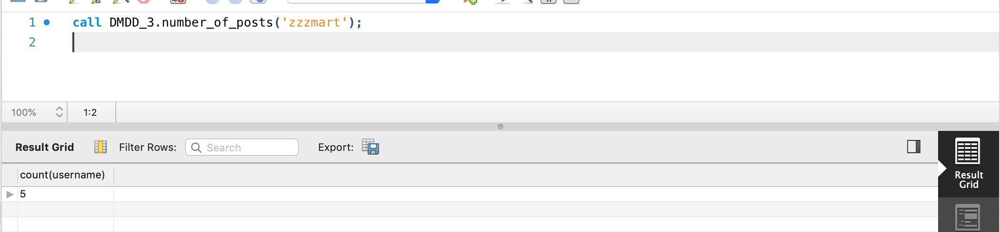

8.  To get the id, username ,title and the score from the consumer table based on the input(popular hashtags or posts) got from the users.

         CREATE DEFINER=`root`@`localhost` PROCEDURE `sp_based_on_posts`(IN subreddit nvarchar(30))
         BEGIN
         SELECT id,username,title,score FROM consumer_3 WHERE subreddit = subreddit;
         END

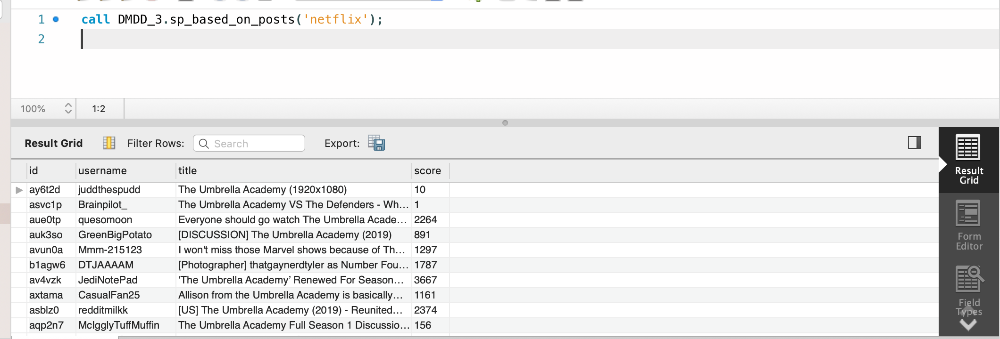

9. To select the username ,title and score form the consumer table based on the input(score of the post) got from the user.

       CREATE DEFINER=`root`@`localhost` PROCEDURE `sp_based_on_score`(IN scores integer)
       BEGIN
       SELECT username,title,score FROM consumer_3 WHERE score >= scores LIMIT 5;
       END

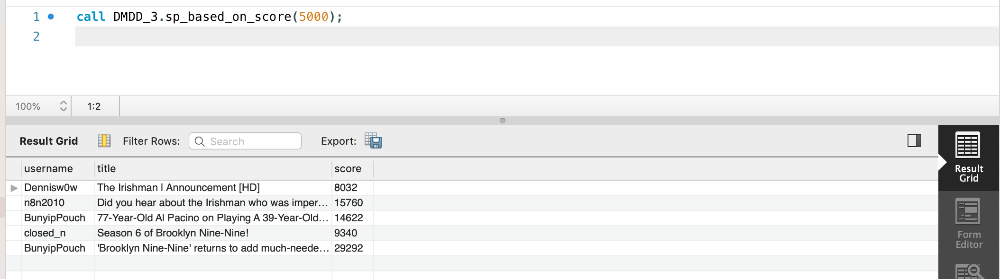

10. To give a list of the all the popular hashtags or posts the users has posted form the consumer table.

        CREATE DEFINER=`root`@`localhost` PROCEDURE `popular_hashtags_posts`()
        BEGIN
        SELECT subreddit FROM consumer_3 GROUP BY subreddit ORDER BY COUNT(subreddit) DESC LIMIT 10;
        END

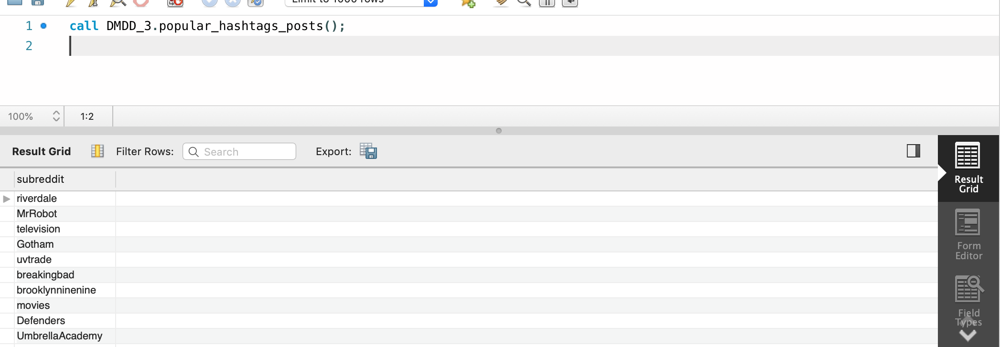

## Views:

Use Case 1 Description: See which Company tweet id starts with 95659 and movie name should be Irishman User Precondition: Company must have Twitter accounts Steps: Find all company with Twitter accounts and then find tweet id starts with the mentioned value and the movie as Irishman Action: Request to see Company with Twitter accounts System Responses: Return all the values from the list.

Use Case Query:

run_query('SELECT * from company where tweet_id like "95659%" and screenname = "Irishman_Movie"')

View Query:
  
    CREATE OR REPLACE VIEW `view_by_screen_tweet` AS 
    SELECT * from company_3 where tweet_id like "95659%" and screenname = "Irishman_Movie";

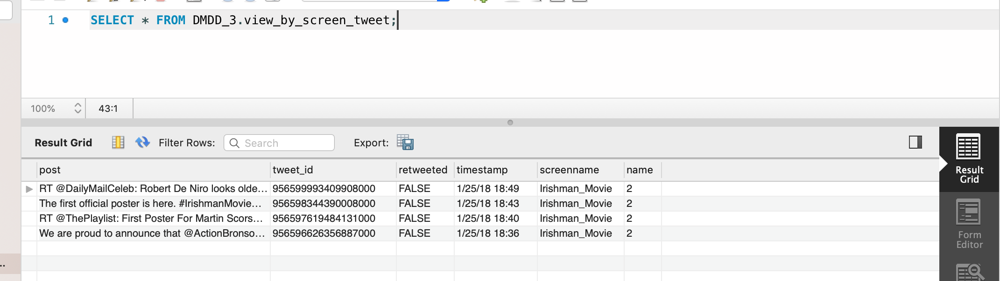

Use Case 2 Description: List all the movies along with their username,time stamp and other details which has received the highest upvote.

USE CASE Query:

run_query('SELECT * from consumer where score >= 500 LIMIT 5')

VIEW QUERY:    
    
       SELECT consumer_3.username,consumer_3.title,consumer_3.id,consumer_3.subreddit,consumer_3.num_comments,
       consumer_3.company_name,consumer_3.time_stamp,consumer_3.score,consumer_upvote.upvote_ratio FROM consumer_3
       INNER JOIN consumer_upvote ON consumer_3.id = consumer_3.id WHERE SCORE>=500 LIMIT 5;

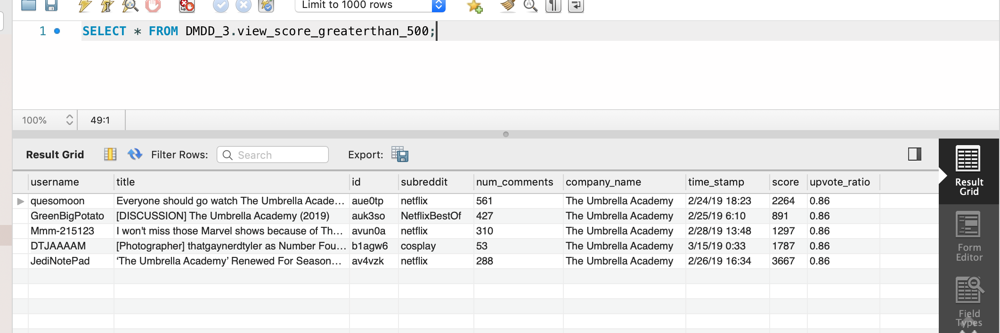

Use Case 3 Description: List all the movies which has the imdb ratings greater than 8, with their movie names,votes, duration of the movie and the genre of the movie.

USE CASE Query:

run_query('SELECT movie_names,imdb_ratings,votes,runtime,genre from consumer_2 WHERE imdb_ratings > 8.0 LIMIT 10')

VIEW QUERY:    
    
    CREATE  OR REPLACE VIEW `view_imdb_greatthan_8` AS 
    SELECT imdb_movies_3.movie_names,imdb_movies_3.imdb_ratings,imdb_movies_3.votes,imdb_movies_3.runtime,
    movie_genre.genre from imdb_movies_3 inner join movie_genre on imdb_movies_3.movie_id = movie_genre.movie_id 
    WHERE imdb_movies_3.imdb_ratings > 8.0 LIMIT 10;

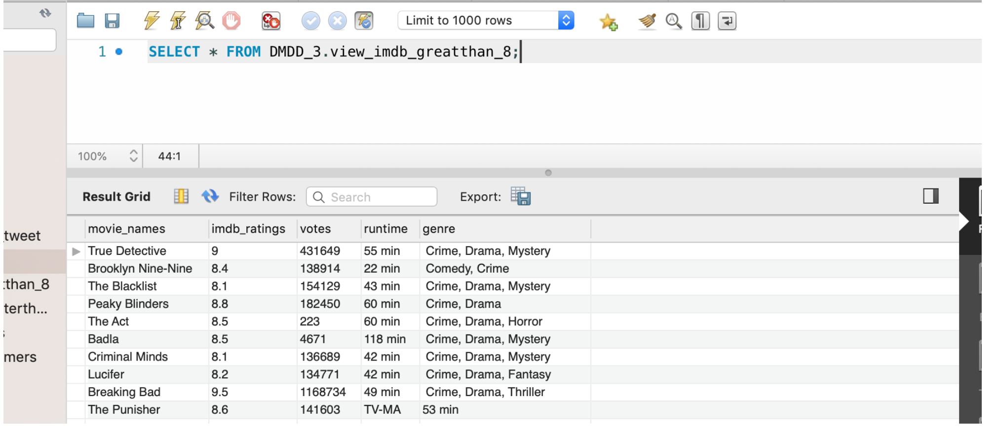

UseCase 4 : List all the movies which as received the highest rating and votes.Action: List all the movies along with its imdb ratings and votes from hightest to lowest based on the number of votes received for each movie.

USE CASE QUERY:

run_query('SELECT movie_names,imdb_ratings,votes FROM consumer_2 GROUP BY movie_names ORDER BY votes DESC LIMIT 10')

VIEW Query:

    CREATE  OR REPLACE VIEW `view_high_votes` AS 
    SELECT movie_names,imdb_ratings,votes FROM imdb_movies_3 
    GROUP BY movie_names ORDER BY votes DESC LIMIT 10;

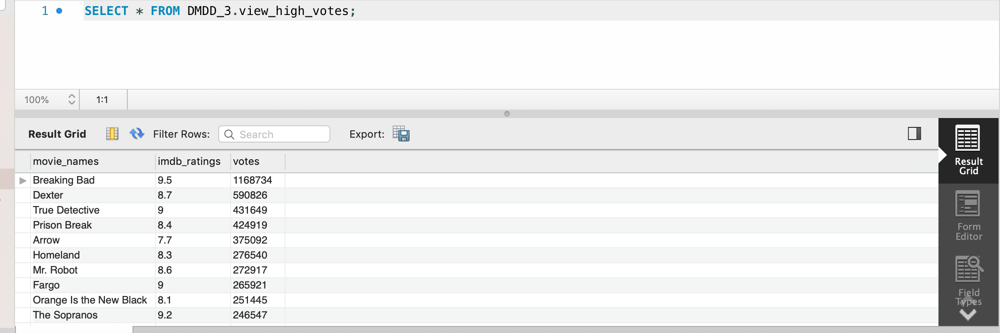

Usecase 5: List all the movies along with their username, title, id, comments count, upvote ratio time stamp and other details which has upvotes value between 500 and 100.

USE CASE QUERY:

run_query('SELECT * from consumer where score BETWEEN 500 AND 1000 LIMIT 5')

VIEW Query:

     CREATE  OR REPLACE VIEW `view_score_bet_500_1000` AS 
     SELECT * from consumer_3 where score BETWEEN 500 AND 1000 LIMIT 5;

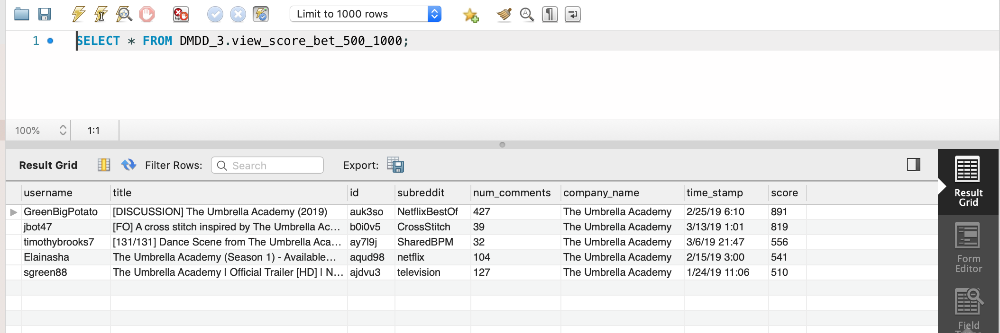

Usecase 6: List all the movie names, genre of the movie and the users who have posted in twitter about the movie The Irishman and the posts they have posted for that movie.

USE CASE Query:

run_query('SELECT consumer_2.movie_names,consumer_2.genre, consumer.username,consumer.title FROM consumer_2 INNER JOIN consumer ON consumer_2.movie_names=consumer.company_name LIMIT 10')

VIEW Query:

    CREATE  OR REPLACE VIEW `view_twitter_irishman_post` AS 
    SELECT movie_imdb_3.movie_names, consumer_3.username,consumer_3.title 
    FROM movie_imdb_3 INNER JOIN consumer_3 ON movie_imdb_3.movie_names = consumer_3.company_name 
    LIMIT 10;

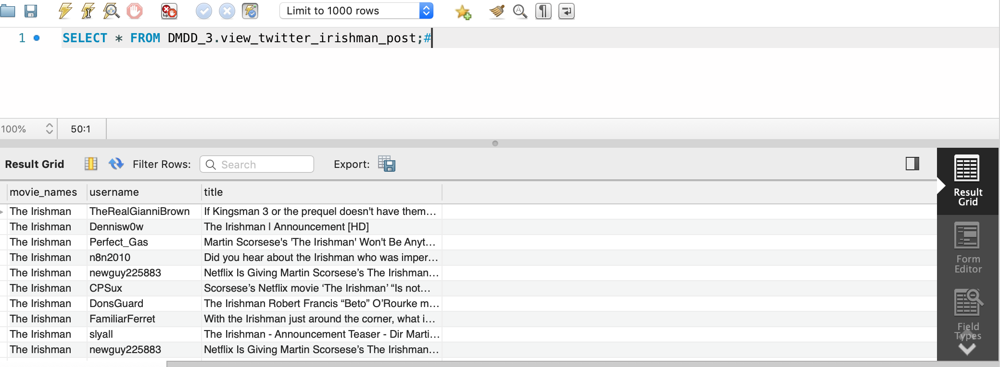

Usecase 7: List all the movie names, genre of the movie and the users who have posted in twitter about the producers or directors of the movie and the posts they have posted for that movie.

USE CASE Query:

run_query('SELECT consumer_2.movie_names,consumer_2.genre, producer.name,producer.post,producer.timestamp FROM consumer_2 INNER JOIN producer ON consumer_2.director_name=producer.name LIMIT 10')

VIEW Query:

    CREATE VIEW `view_prod_direct` AS SELECT movies.movie_names,movies.genre,
    producers.name,producers.post,producers.timestamp FROM movies 
    INNER JOIN producers ON movies.director_name = producers.name LIMIT 10;

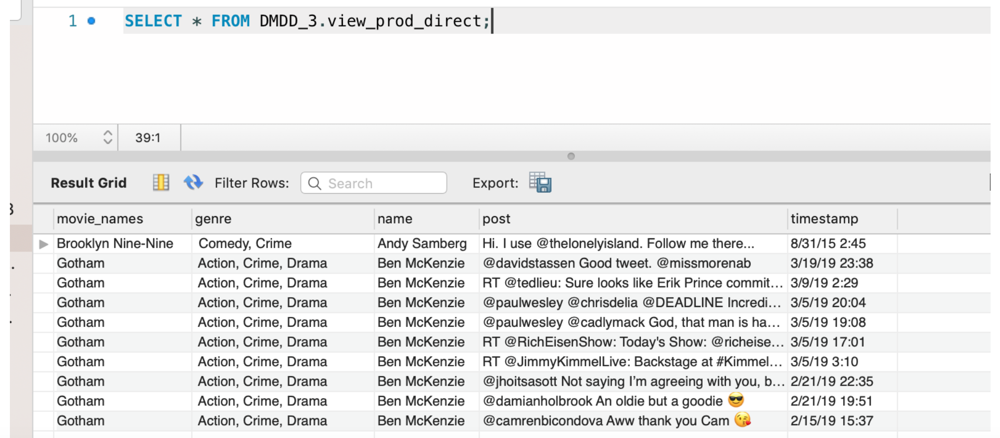

UseCase 8: List all the movies along with its description and which has a R certificate.

USE CASE Query:

run_query('Select movie_names,movie_description,certificate from consumer_2 where certificate="R" and imdb_ratings>6 LIMIT 10')

VIEW Query:

    CREATE OR REPLACE VIEW `view_certificate_r` AS 
    SELECT movie_names,movie_description,certificate FROM movies 
    WHERE certificate="R" AND imdb_ratings>6 LIMIT 10;

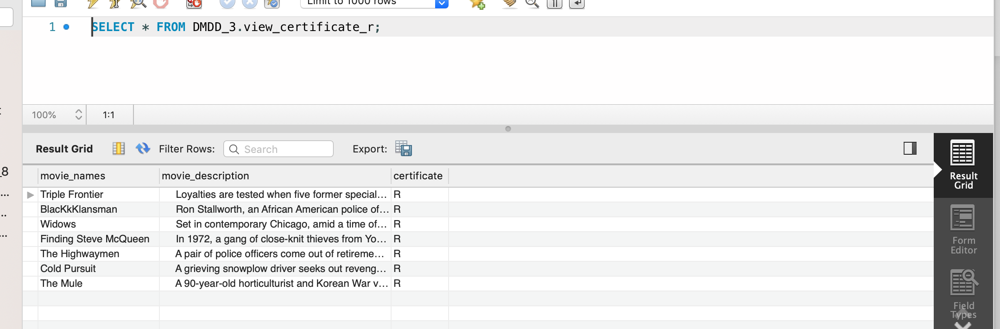

UseCase 9: List all the details the user name, posts,post id , comment number, upvote ratio, score,company name and time stamp where user name is McIgglyTuffMuffin.

USE CASE Query:

run_query('SELECT * from consumer where username= "McIgglyTuffMuffin"')


VIEW Query:

     CREATE OR REPLACE VIEW `view_user_name` AS SELECT * FROM consumer_3
     WHERE username= "McIgglyTuffMuffin";

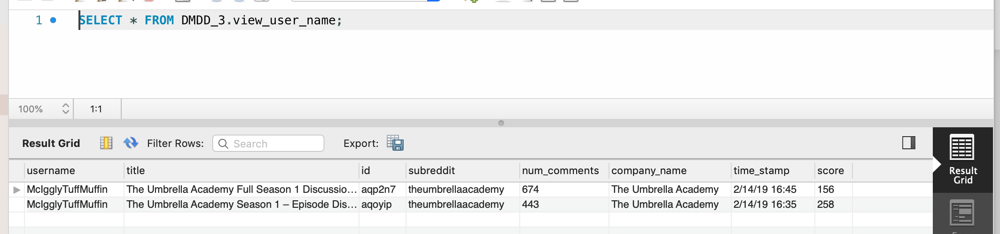

Usecase 10: List name,screen name,posts and tweet id from the company where the movie name is Brooklyn Nine-Nine.

USE CASE Query:

run_query('Select name,screenname,post,tweet_id from company where name ="Brooklyn Nine-Nine" ORDER BY tweet_id LIMIT 10')

VIEW Query:

    Select company_name.name,company_3.screenname,company_3.post,company_3.tweet_id FROM company_3 
    INNER JOIN company_name ON company_3.name = company_name.name_id
    WHERE company_name.name = "Brooklyn Nine-Nine" ORDER BY tweet_id LIMIT 10;

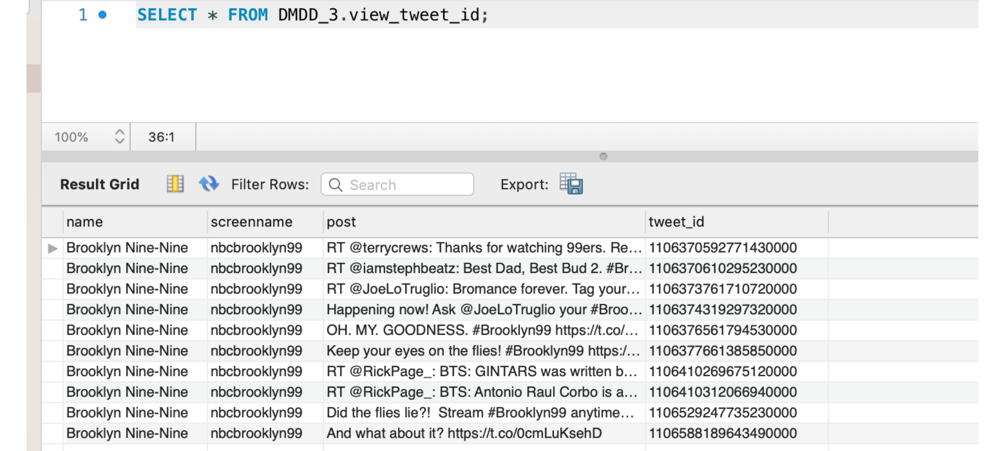

## Functions:

1.  SELECT CONCAT_WS("-", movie_names, director_name,imdb_ratings) AS Moviename_Direct_Rate FROM movie_imdb_3;

This function is concatinating the movie name, director name and the IMDB rating of that particular movie. We will be able to retrive all those 3 things under the named "Moviename_Direct_Rate".

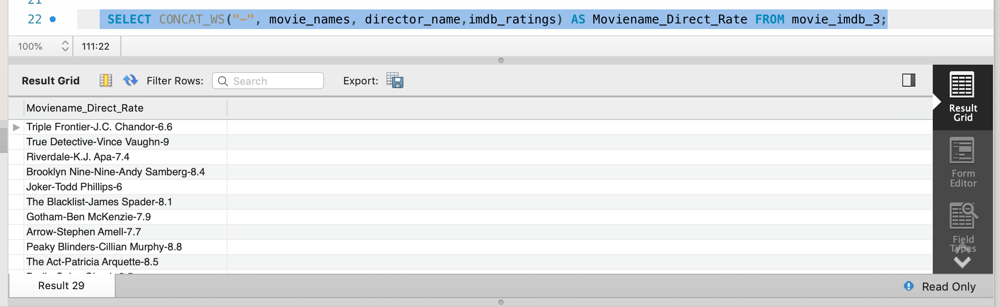

2.This function is concatinating the movie name and movie description of one particular movie. We will be able to retrive all those things under the named "abt_the_movie".

SELECT CONCAT(movie_names, "-", movie_description) AS abt_the_movie FROM movie_imdb_3;

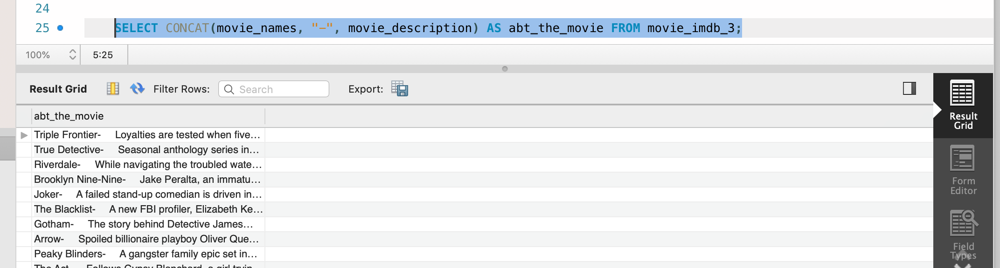

3.This function is returning the number of instances of the given string "the".

      SELECT movie_names,INSTR(movie_names, "the") FROM movie_imdb_3;

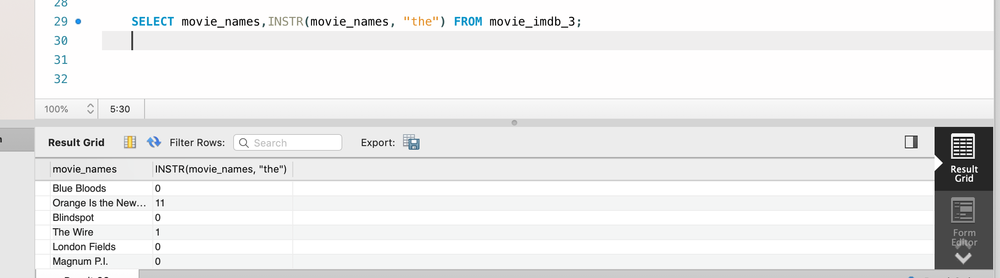

4. We are calculating the average of all the IMDB ratings from all movies in the table.

    select avg(imdb_ratings) as AVG_RATING from movie_imdb_3;

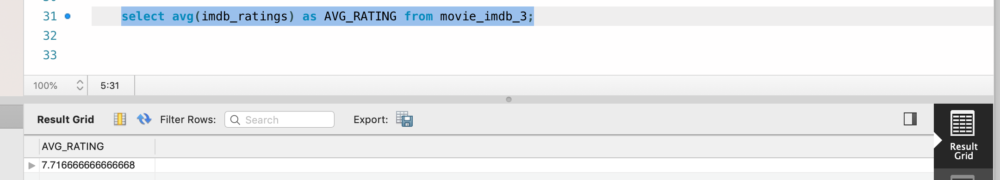

5.This function is counting the number of movies released in the particular year mentioned.

SELECT COUNT(year_release) AS year_release_count FROM movie_imdb_3 WHERE year_release=2018;

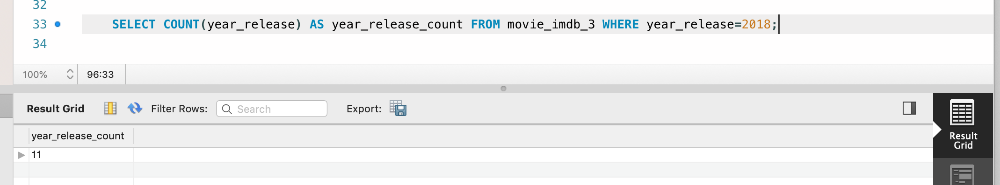

6.This function will return the screennames as distinct elements and displays it under the column screenname, which will be retrieved from the table company_3.


SELECT DISTINCT(screenname) FROM company_3;

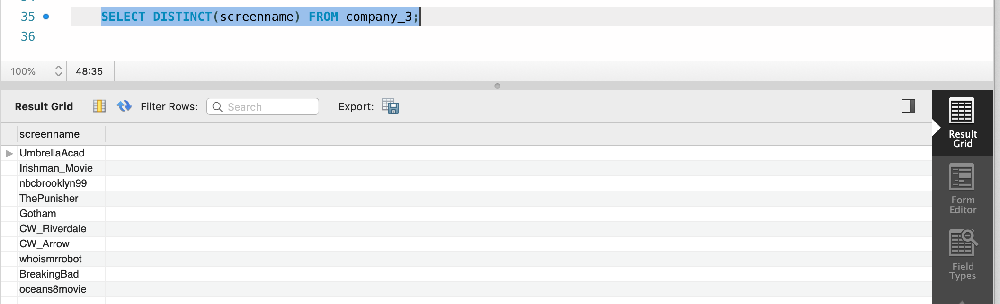

7.This function is returning the lowest and the highest IMDB ratings out of overall ratings of all movies.

SELECT MIN(imdb_ratings), MAX(imdb_ratings) as MAX_MIN_RATING from movie_imdb_3;

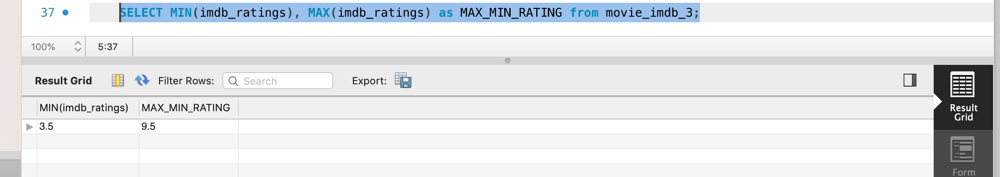

8.This function is returning the date from the timestamp and post of all movies in the list from the table "company".

SELECT DATE(timestamp),post AS post FROM company;

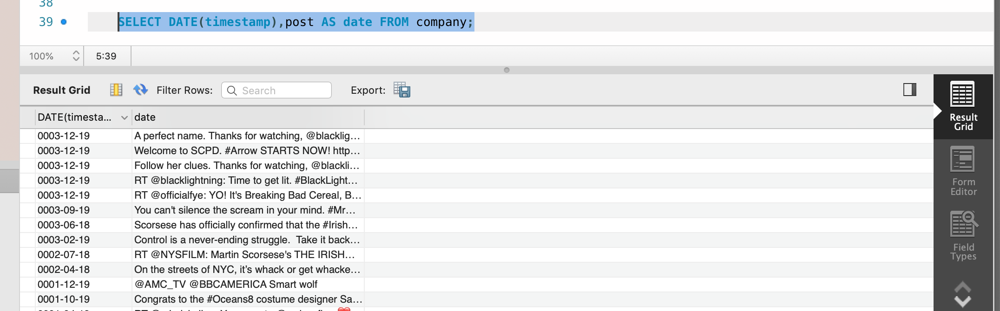

9.This function is returning the date from the timestamp and post of all movies in the list from the table "company".


 SELECT TIME(timestamp),post AS date FROM company;

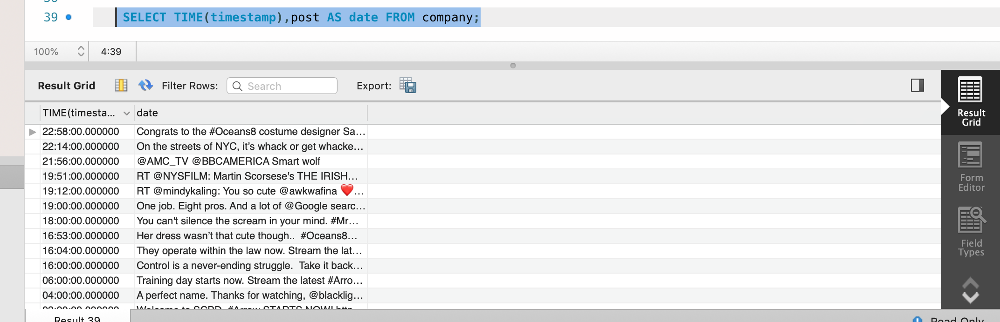

10. This function returns the posts and tweet_id of all the tweets which are posted in December

SELECT post,tweet_id from producers_2 where  MONTHNAME(timestamp)= 'December';

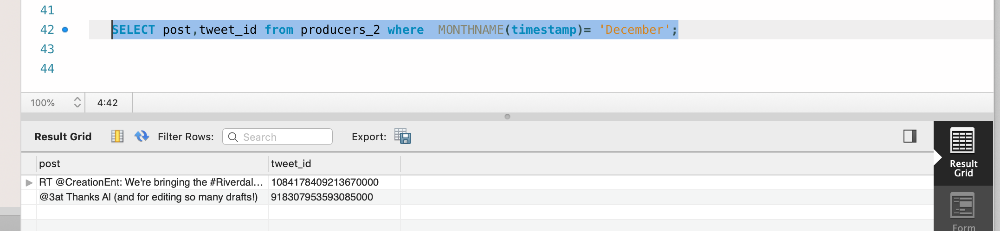

Indexes:

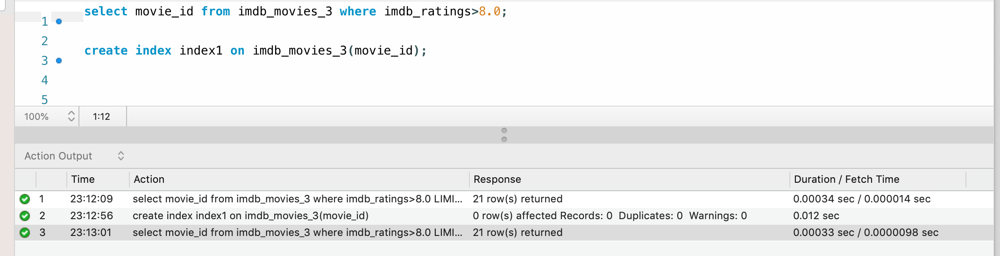

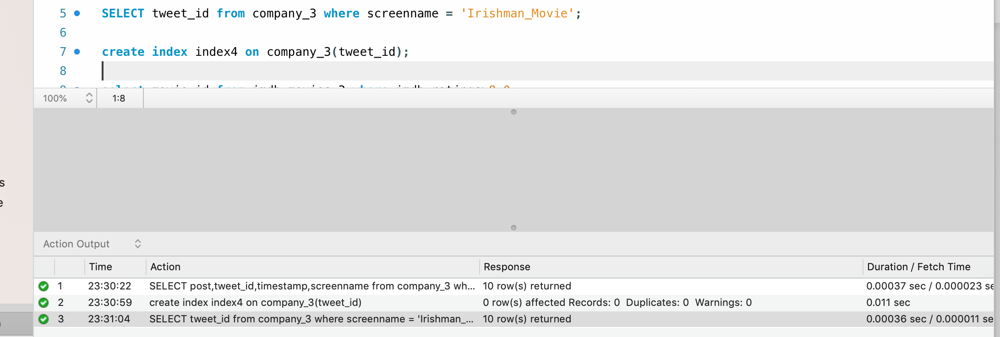

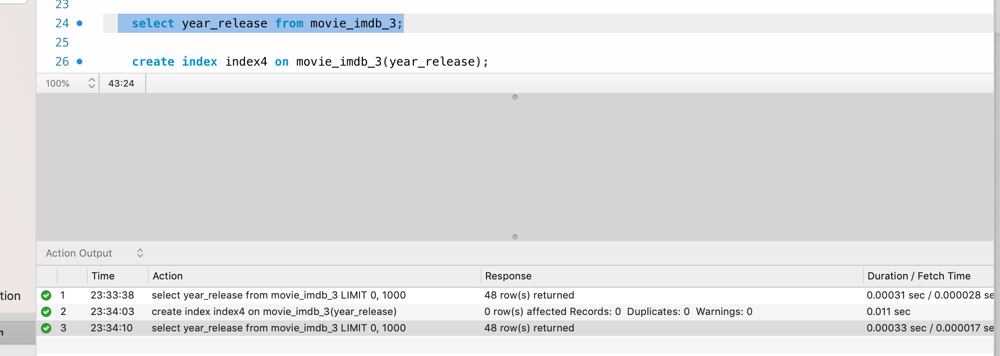

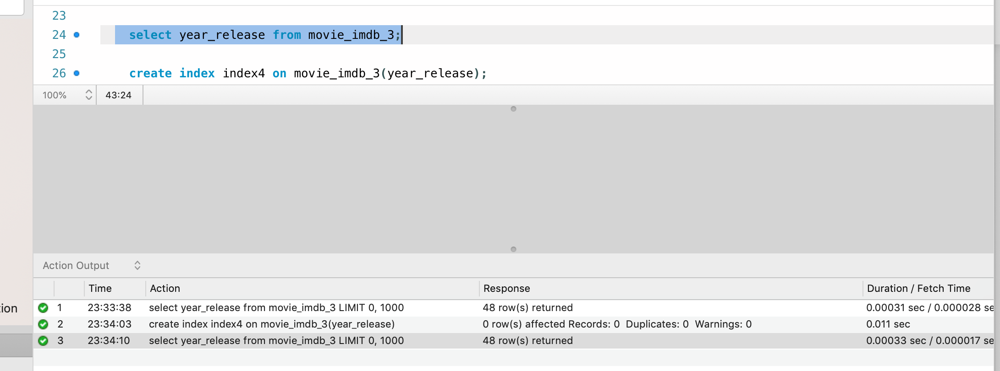

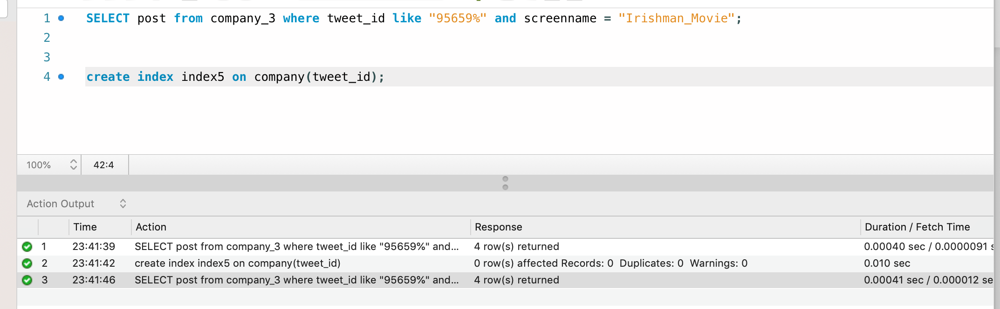

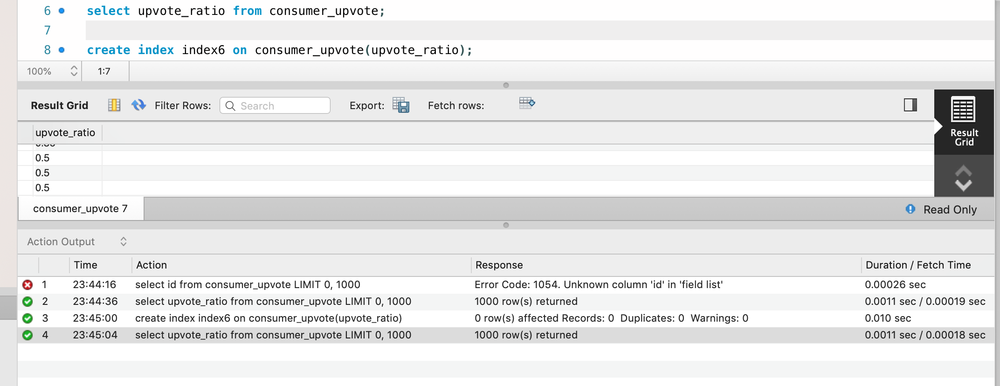

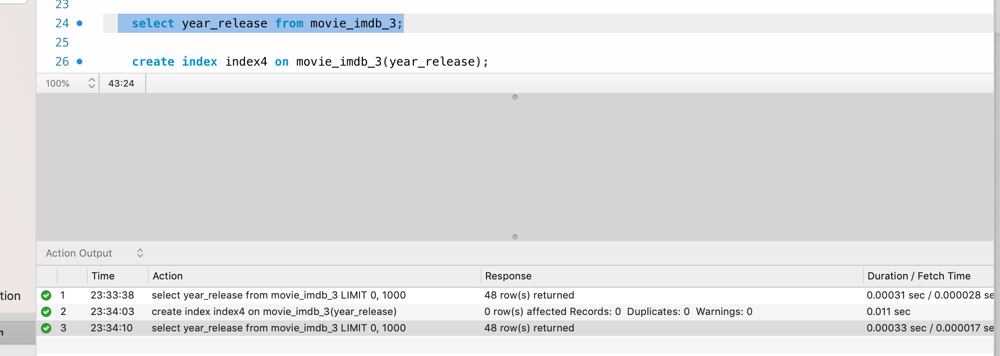